In [17]:
from torchvision.datasets import VOCDetection
from torchvision import models, transforms
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader

# Transform image to ResNet features
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load VOC 2007 detection dataset
dataset = VOCDetection(root='~/', year='2007', image_set='train', download=True, transform=transform)

Visualizing multi-image classification samples from VOC dataset:
Sample 2348 contains: cat
Sample 1327 contains: sheep
Sample 591 contains: boat
Sample 67 contains: bird, bird
Sample 1270 contains: dog, dog
Sample 2037 contains: tvmonitor
Sample 1548 contains: bus
Sample 1180 contains: person, dog


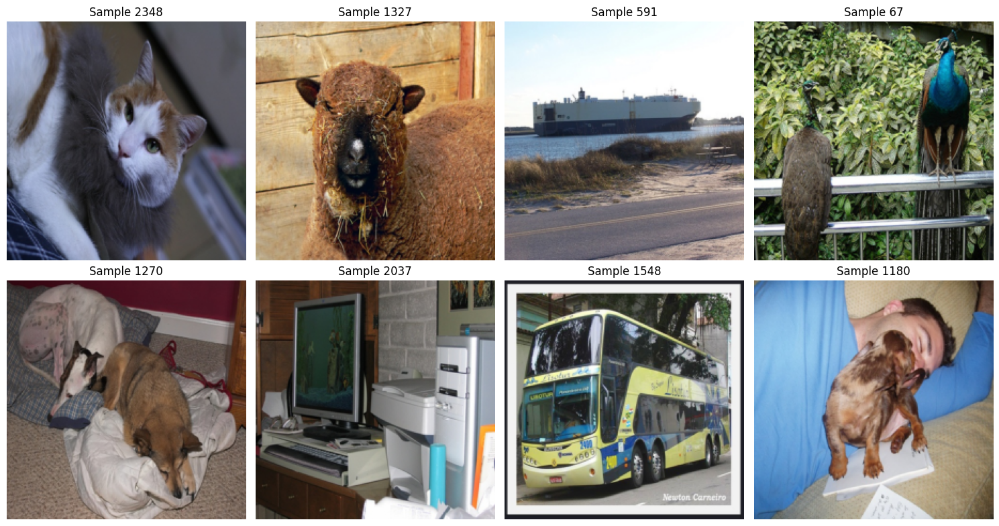

In [18]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random

# Function to visualize multi-image classification samples
def visualize_samples(dataset, num_samples=8, grid_size=(2, 4)):
    """
    Visualize samples from the dataset in a grid layout
    """
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(15, 8))
    axes = axes.flatten()
    
    # Sample random indices
    indices = random.sample(range(len(dataset)), num_samples)
    
    for i, idx in enumerate(indices):
        image, target = dataset[idx]
        
        # Convert tensor to PIL Image for display
        if isinstance(image, torch.Tensor):
            # Denormalize if needed and convert to numpy
            img_np = image.permute(1, 2, 0).numpy()
            img_np = np.clip(img_np, 0, 1)
        else:
            img_np = np.array(image)
        
        axes[i].imshow(img_np)
        axes[i].set_title(f'Sample {idx}')
        axes[i].axis('off')
        
        # Print annotation info
        if 'annotation' in target:
            objects = target['annotation']['object']
            if isinstance(objects, list):
                labels = [obj['name'] for obj in objects]
            else:
                labels = [objects['name']]
            print(f"Sample {idx} contains: {', '.join(labels)}")
    
    plt.tight_layout()
    plt.show()

# Visualize samples
print("Visualizing multi-image classification samples from VOC dataset:")
visualize_samples(dataset)

Enhanced multi-image classification visualization:


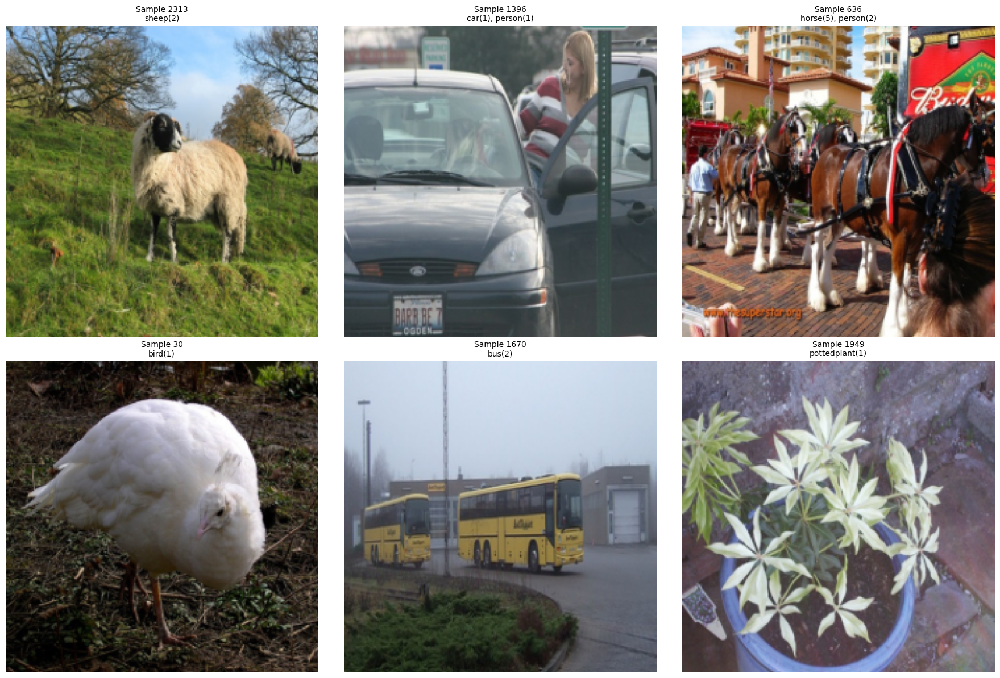

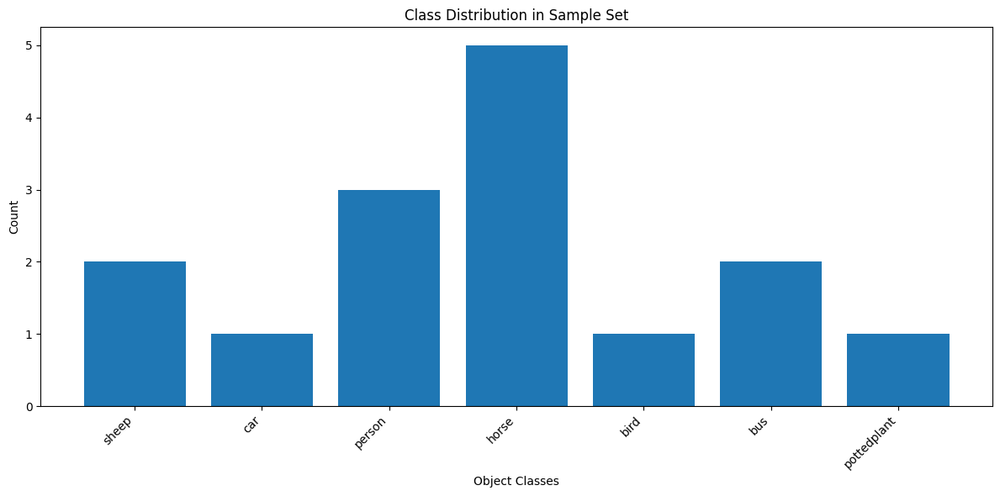

Found 7 unique classes: ['sheep', 'car', 'person', 'horse', 'bird', 'bus', 'pottedplant']


In [19]:
# Enhanced visualization with class statistics and bounding boxes
def visualize_with_stats(dataset, num_samples=6):
    """
    Visualize samples with class statistics and bounding box overlays
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    # Collect class statistics
    all_classes = []
    indices = random.sample(range(len(dataset)), num_samples)
    
    for i, idx in enumerate(indices):
        image, target = dataset[idx]
        
        # Convert tensor to numpy for visualization
        if isinstance(image, torch.Tensor):
            img_np = image.permute(1, 2, 0).numpy()
            img_np = np.clip(img_np, 0, 1)
        else:
            img_np = np.array(image) / 255.0 if np.max(image) > 1 else np.array(image)
        
        axes[i].imshow(img_np)
        
        # Extract and display class information
        if 'annotation' in target:
            objects = target['annotation']['object']
            if not isinstance(objects, list):
                objects = [objects]
            
            classes_in_image = [obj['name'] for obj in objects]
            all_classes.extend(classes_in_image)
            
            # Create title with class info
            class_counts = {}
            for cls in classes_in_image:
                class_counts[cls] = class_counts.get(cls, 0) + 1
            
            title = f"Sample {idx}\n" + ", ".join([f"{cls}({count})" for cls, count in class_counts.items()])
            axes[i].set_title(title, fontsize=10)
        
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Show class distribution across samples
    if all_classes:
        from collections import Counter
        class_counts = Counter(all_classes)
        
        plt.figure(figsize=(12, 6))
        plt.bar(class_counts.keys(), class_counts.values())
        plt.title('Class Distribution in Sample Set')
        plt.xlabel('Object Classes')
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
        
        print(f"Found {len(class_counts)} unique classes: {list(class_counts.keys())}")

# Run enhanced visualization
print("Enhanced multi-image classification visualization:")
visualize_with_stats(dataset)

In [20]:
# Filter out images with 0 labels
def filter_valid_samples(dataset):
    """
    Filter dataset to only include samples with valid annotations
    """
    valid_indices = []
    
    for i in range(len(dataset)):
        _, target = dataset[i]
        
        # Check if annotation exists and has objects
        if 'annotation' in target and 'object' in target['annotation']:
            objects = target['annotation']['object']
            if objects:  # Not empty
                valid_indices.append(i)
    
    print(f"Original dataset size: {len(dataset)}")
    print(f"Valid samples with labels: {len(valid_indices)}")
    print(f"Filtered out {len(dataset) - len(valid_indices)} samples with 0 labels")
    
    return valid_indices

# Get valid indices
valid_indices = filter_valid_samples(dataset)

# Create a filtered dataset wrapper
class FilteredDataset:
    def __init__(self, original_dataset, valid_indices):
        self.original_dataset = original_dataset
        self.valid_indices = valid_indices
    
    def __len__(self):
        return len(self.valid_indices)
    
    def __getitem__(self, idx):
        original_idx = self.valid_indices[idx]
        return self.original_dataset[original_idx]

# Create filtered dataset
filtered_dataset = FilteredDataset(dataset, valid_indices)

Original dataset size: 2501
Valid samples with labels: 2501
Filtered out 0 samples with 0 labels


Visualizing samples from filtered dataset (only images with labels):
Sample 181 contains: bird
Sample 1501 contains: dog, car
Sample 485 contains: person, person, car, car
Sample 30 contains: bird
Sample 1997 contains: cat
Sample 2454 contains: chair, chair, person, person, person, person
Sample 660 contains: bird, bird, bird, bird, bird, bird, bird
Sample 1885 contains: car, car


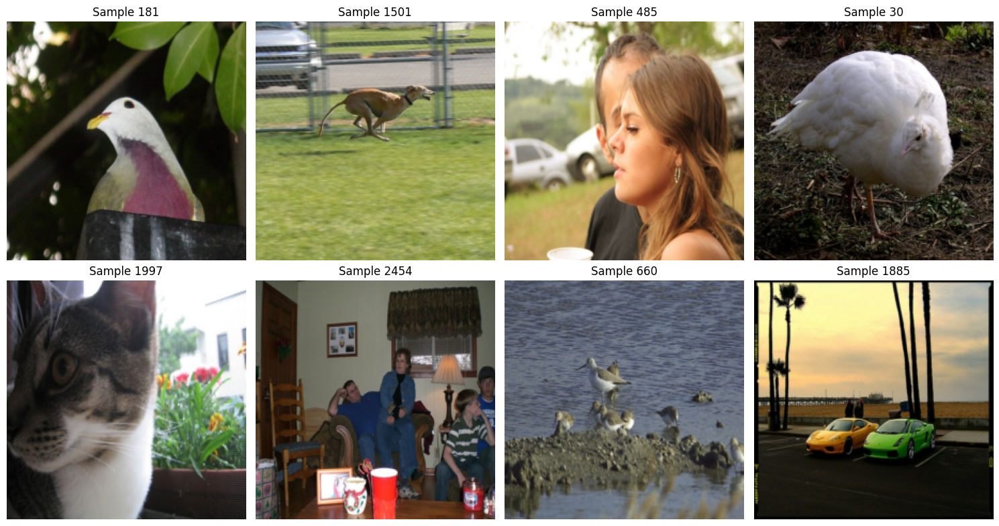


Enhanced visualization with filtered dataset:


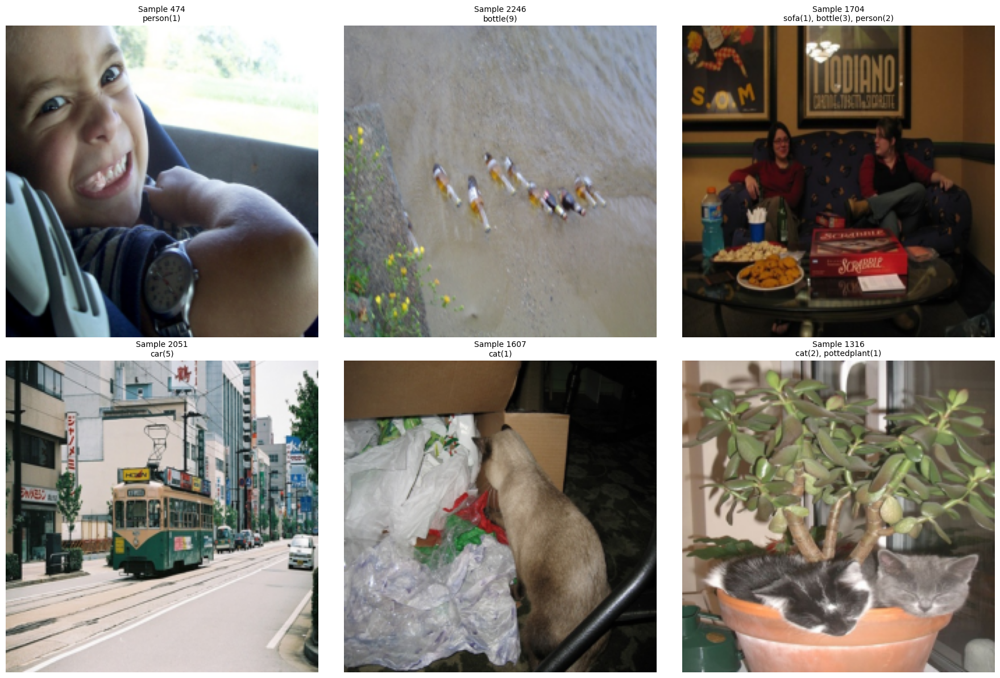

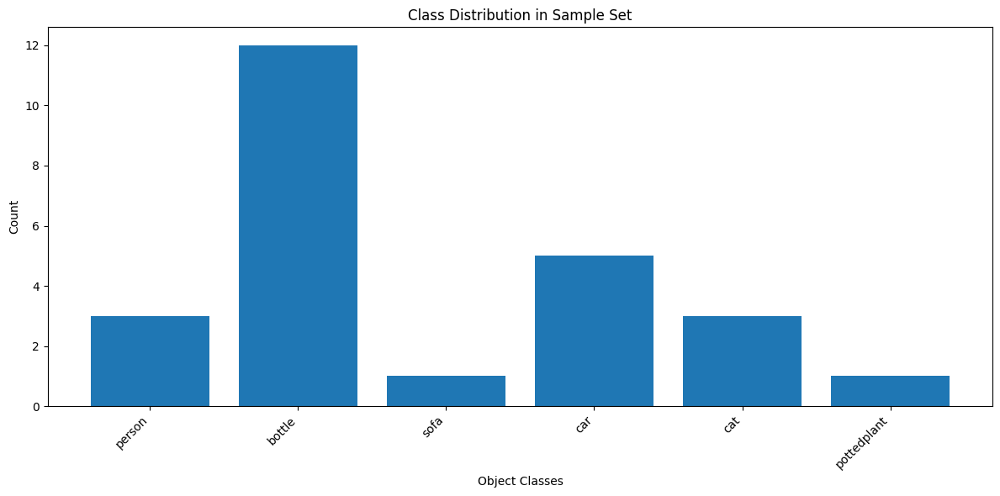

Found 6 unique classes: ['person', 'bottle', 'sofa', 'car', 'cat', 'pottedplant']


In [21]:
# Visualize samples from filtered dataset
print("Visualizing samples from filtered dataset (only images with labels):")
visualize_samples(filtered_dataset)

print("\nEnhanced visualization with filtered dataset:")
visualize_with_stats(filtered_dataset)

In [22]:
# Map label names to vector
VOC_CLASSES = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle',
               'bus', 'car', 'cat', 'chair', 'cow',
               'diningtable', 'dog', 'horse', 'motorbike', 'person',
               'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']

label_to_index = {cls: i for i, cls in enumerate(VOC_CLASSES)}

def encode_labels(target):
    objs = target['annotation']['object']
    labels = torch.zeros(len(VOC_CLASSES))
    if not isinstance(objs, list):
        objs = [objs]
    for obj in objs:
        cls = obj['name']
        labels[label_to_index[cls]] = 1
    return labels

In [23]:
# Create features via ResNet (just 1 batch for now)
resnet = models.resnet18(pretrained=True)
resnet.fc = torch.nn.Identity()  # remove classifier
resnet.eval()

/Users/nipun/base/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/nipun/base/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [24]:
# Load a few examples
X_feat = []
Y_labels = []

for i in range(10):  # just 10 images
    img, target = dataset[i]
    with torch.no_grad():
        feat = resnet(img.unsqueeze(0)).squeeze()
    X_feat.append(feat)
    Y_labels.append(encode_labels(target))

X = torch.stack(X_feat)
Y = torch.stack(Y_labels)

print("Feature shape:", X.shape)  # (10, 512)
print("Label shape:", Y.shape)    # (10, 20)

Feature shape: torch.Size([10, 512])
Label shape: torch.Size([10, 20])


In [25]:
import torch.nn.functional as F

# Assume X, Y are from your setup (after filtering out label-less samples)
n, d = X.shape     # e.g., (num_samples, 512)
c = Y.shape[1]     # number of classes, e.g., 20
k = 2              # top-k

# Linear classifier: feature → class logits
W = torch.nn.Parameter(torch.randn(d, c) * 0.01)
b = torch.nn.Parameter(torch.zeros(c))
optimizer = torch.optim.Adam([W, b], lr=0.1)


In [26]:

def soft_topk_gumbel(logits, k, temperature=0.5):
    """
    Differentiable Top-k using Gumbel softmax.
    Returns soft probabilities over classes (still sums to 1).
    """
    u = torch.rand_like(logits)
    gumbel = -torch.log(-torch.log(u + 1e-9) + 1e-9)
    y = F.softmax((logits + gumbel) / temperature, dim=-1)
    return y

In [27]:
# Show usage of soft_topk_gumbel
logits = X @ W + b  # (n, c)
topk_probs = soft_topk_gumbel(logits, k)
# Print top-k probabilities
print("Top-k probabilities (soft):", topk_probs)

Top-k probabilities (soft): tensor([[9.9637e-01, 5.5686e-06, 1.1433e-05, 1.7464e-03, 2.9628e-05, 2.5912e-05,
         3.8748e-04, 1.6770e-05, 6.6612e-05, 3.5153e-04, 6.6189e-04, 1.0212e-04,
         3.4765e-05, 7.5857e-07, 2.3704e-06, 3.5112e-05, 1.3627e-05, 1.7078e-05,
         4.9879e-06, 1.1496e-04],
        [1.3692e-04, 1.7046e-03, 1.1450e-02, 2.1333e-03, 1.6845e-02, 2.9369e-03,
         1.2837e-03, 8.2537e-02, 2.2774e-03, 5.7773e-01, 1.9119e-02, 3.0098e-02,
         8.0061e-02, 1.5937e-03, 7.2541e-03, 8.4785e-04, 4.1571e-04, 1.5525e-01,
         6.2160e-03, 1.0786e-04],
        [1.9352e-04, 1.0938e-03, 4.8861e-04, 1.9047e-04, 7.6948e-04, 8.2843e-06,
         5.2209e-04, 2.3692e-04, 4.5732e-05, 6.2262e-05, 2.5813e-01, 2.1752e-03,
         3.5717e-05, 9.8115e-05, 1.9879e-05, 4.3296e-01, 5.4662e-05, 1.3929e-04,
         3.0202e-01, 7.5792e-04],
        [1.5340e-03, 7.5786e-04, 5.9654e-04, 2.1572e-02, 1.8610e-03, 7.1698e-02,
         3.9615e-04, 8.4081e-03, 4.5102e-04, 3.2607e-03, 9.2

In [29]:
topk_preds = torch.topk(topk_probs, k=2, dim=1).indices
# Print top-k predictions
print("Top-k predictions (indices):", topk_preds)

Top-k predictions (indices): tensor([[ 0,  3],
        [ 9, 17],
        [15, 18],
        [19,  5],
        [ 5, 12],
        [ 2,  4],
        [10,  4],
        [19, 15],
        [10,  0],
        [19,  3]])


In [30]:
# Print ground truth vs predictions
print("Ground truth vs predictions:")
for i in range(len(Y)):
    print("GT:", torch.nonzero(Y[i]).squeeze().tolist(),
          "Pred:", topk_preds[i].tolist())

Ground truth vs predictions:
GT: 6 Pred: [0, 3]
GT: [12, 14] Pred: [9, 17]
GT: [1, 14] Pred: [15, 18]
GT: 6 Pred: [19, 5]
GT: [0, 14] Pred: [5, 12]
GT: 0 Pred: [2, 4]
GT: 18 Pred: [10, 4]
GT: [10, 14] Pred: [19, 15]
GT: 11 Pred: [10, 0]
GT: 18 Pred: [19, 3]


In [31]:
# Precision@k
correct = 0
for i in range(len(Y)):
    correct += Y[i][topk_preds[i]].sum().item()
print(f"Precision@{k} = {correct / (len(Y) * k):.2f}")

Precision@2 = 0.00


In [32]:
for epoch in range(100):
    total_loss = 0.0
    for i in range(n):
        x_i = X[i]          # (d,)
        y_true = Y[i]       # (c,)

        logits = x_i @ W + b  # (c,)
        probs = soft_topk_gumbel(logits, k=k, temperature=0.5)

        # Loss: encourage probs to match true multi-hot labels
        match = torch.sum(probs * y_true)
        loss = -match  # maximize match with true labels

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    if epoch % 10 == 0:
        print(f"Epoch {epoch}, Avg Loss: {total_loss/n:.4f}")

Epoch 0, Avg Loss: -0.1000
Epoch 10, Avg Loss: -0.2000
Epoch 20, Avg Loss: -0.2000
Epoch 30, Avg Loss: -0.2000
Epoch 40, Avg Loss: -0.2000
Epoch 50, Avg Loss: -0.2000
Epoch 60, Avg Loss: -0.2000
Epoch 70, Avg Loss: -0.2000
Epoch 80, Avg Loss: -0.2000
Epoch 90, Avg Loss: -0.2000


In [33]:
# After training
with torch.no_grad():
    for i in range(min(5, n)):
        x_i = X[i]
        y_true = Y[i]
        logits = x_i @ W + b

        # Top-k with Gumbel
        u = torch.rand_like(logits)
        gumbel = -torch.log(-torch.log(u + 1e-9) + 1e-9)
        scores = logits + gumbel
        topk = torch.topk(scores, k=k).indices

        print(f"Image {i}")
        print("  True labels: ", torch.nonzero(y_true).squeeze().tolist())
        print("  Gumbel Top-k:", topk.tolist())
        print()

Image 0
  True labels:  6
  Gumbel Top-k: [6, 19]

Image 1
  True labels:  [12, 14]
  Gumbel Top-k: [6, 19]

Image 2
  True labels:  [1, 14]
  Gumbel Top-k: [6, 0]

Image 3
  True labels:  6
  Gumbel Top-k: [6, 0]

Image 4
  True labels:  [0, 14]
  Gumbel Top-k: [6, 0]

